# ECE Farm Satellite Base Map & Grid Chunk Validation

This experiment generates high-resolution satellite basemaps with dynamic satellite and static soil grid overlays for the new ECE soil moisture sensor deployment.

- **Farm Center**: 7^\circ 10' 52.1''	ext{ N}, 122^\circ 01' 56.5''	ext{ W}$ (7.181139^\circ	ext{ N}, -122.032361^\circ	ext{ W}$)
- **Spatial Extent**: .0	ext{ km} 	imes 2.0	ext{ km}$ ( = 1	ext{ km}$ territory around the center)
- **Location**: Near Buckley / Enumclaw, Pierce County, Washington

### Motivation
Previous in-situ deployments revealed that sensors placed in close proximity ($\sim 50	ext{ m}$) fall into identical satellite pixels and buffer extraction footprints, producing identical model predictions despite ground-truth variations. This notebook provides reference grid chunk overlays and statistically verifies that distributing sensors across different chunks yields distinct satellite and soil feature vectors.

In [1]:
import sys
import math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import contextily as ctx

# Ensure experiment directory and generator module are in Python path
EXP_DIR = Path(".").resolve()
if (EXP_DIR / "farm_grid_generator.py").exists():
    sys.path.insert(0, str(EXP_DIR))
elif (Path("notebooks/experiment/ece_farm_satellite_chunks")).exists():
    sys.path.insert(0, str(Path("notebooks/experiment/ece_farm_satellite_chunks").resolve()))

from farm_grid_generator import (
    FARM_CENTER_LAT, FARM_CENTER_LON,
    get_farm_bounds, generate_grid_chunks,
    fetch_elevation_grid, extract_soil_features,
    fetch_satellite_image_tile, extract_optical_features_from_image,
    plot_satellite_grid_map, plot_soil_grid_map,
    plot_terrain_contour_map, plot_feature_heterogeneity_heatmap
)

FIG_DIR = EXP_DIR / "figures"
FIG_DIR.mkdir(parents=True, exist_ok=True)

print(f"Setup complete. Farm Center: {FARM_CENTER_LAT:.6f}°N, {FARM_CENTER_LON:.6f}°W")
print(f"Figures directory: {FIG_DIR}")

Setup complete. Farm Center: 47.181139°N, -122.032361°W
Figures directory: /scratch/group/p.cis250607.000/MDR-Project/notebooks/experiment/ece_farm_satellite_chunks/figures


## 1. Spatial Grid Partitioner

We partition the .0	ext{ km} 	imes 2.0	ext{ km}$ farm territory ($\pm 1	ext{ km}$ from the center) into an  	imes 8$ regular grid of 50	ext{ m} 	imes 250	ext{ m}$ chunks. This spatial scale matches MODIS 50	ext{m}$ NDVI products and groups fine Sentinel-2 pixels into clear operational zones for sensor deployment.

In [2]:
df_chunks = generate_grid_chunks(grid_size=8)
print(f"Generated {len(df_chunks)} grid chunks (8x8 grid).")
print(f"Latitude Span:  [{df_chunks['sw_lat'].min():.5f}°N, {df_chunks['ne_lat'].max():.5f}°N]")
print(f"Longitude Span: [{df_chunks['sw_lon'].min():.5f}°W, {df_chunks['ne_lon'].max():.5f}°W]")
df_chunks[['chunk_id', 'row', 'col', 'center_lat', 'center_lon', 'dist_from_center_m']].head(8)

Generated 64 grid chunks (8x8 grid).
Latitude Span:  [47.17503°N, 47.18724°N]
Longitude Span: [-122.04134°W, -122.02338°W]


,chunk_id,row,col,center_lat,center_lon,dist_from_center_m
0,R08_C01,8,1,47.175796,-122.040221,1237.436867
1,R08_C02,8,2,47.175796,-122.037975,1075.290658
2,R08_C03,8,3,47.175796,-122.035730,951.971638
3,R08_C04,8,4,47.175796,-122.033484,883.883476
4,R08_C05,8,5,47.175796,-122.031238,883.883476
5,R08_C06,8,6,47.175796,-122.028992,951.971638
6,R08_C07,8,7,47.175796,-122.026747,1075.290658
7,R08_C08,8,8,47.175796,-122.024501,1237.436867


## 2. Dynamic Satellite Base Map & Grid Chunk Overlay

We download high-resolution satellite imagery (Esri World Imagery) and overlay the 250m reference grid chunks and 1000m macro-scale quadrants. The exact GPS farm center (7^\circ 10' 52.1''	ext{ N}, 122^\circ 01' 56.5''	ext{ W}$) is marked with a distinctive crosshair and coordinate callout.

Figure 1 saved to: /scratch/group/p.cis250607.000/MDR-Project/notebooks/experiment/ece_farm_satellite_chunks/figures/farm_basemap_satellite_grid.png


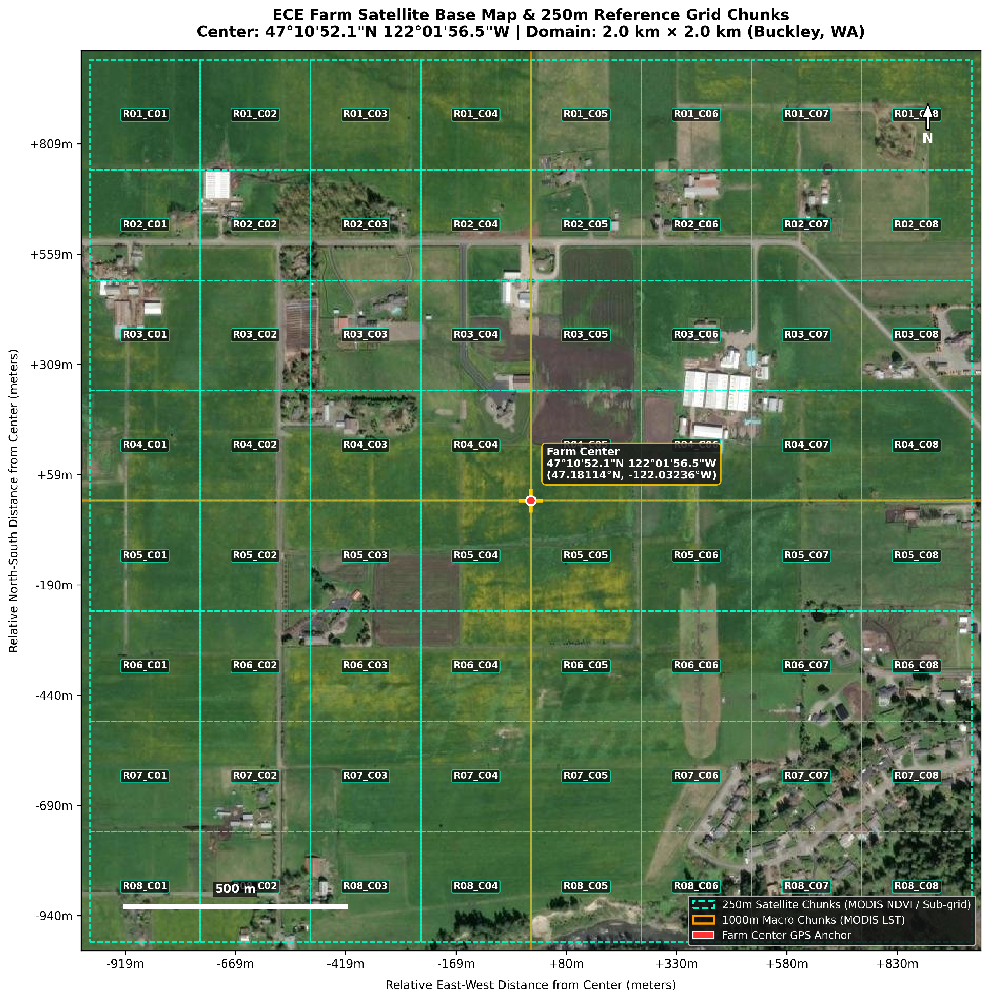

In [3]:
img, ext = fetch_satellite_image_tile()
fig1_path = FIG_DIR / "farm_basemap_satellite_grid.png"
plot_satellite_grid_map(df_chunks, img, ext, fig1_path)
print(f"Figure 1 saved to: {fig1_path}")

# Display the generated map
from IPython.display import Image, display
display(Image(filename=str(fig1_path), width=750))

## 3. Static Soil Features & Texture Grid Overlay

Soil properties represent critical static inputs in MDR soil moisture models. Below, we integrate USDA SSURGO soil map unit polygons and SoilGrids 250m texture profiles:
- **Buckley series** (lowland flats, poorly drained, high organic matter)
- **Wilkeson series** (silt-rich terrace soils, moderate drainage)
- **Kapowsin series** (upland glacial till, denser bulk density)

Each chunk displays its mapped soil series, sand/clay fractions, and organic matter percentage.

Figure 2 saved to: /scratch/group/p.cis250607.000/MDR-Project/notebooks/experiment/ece_farm_satellite_chunks/figures/farm_basemap_soil_grid.png


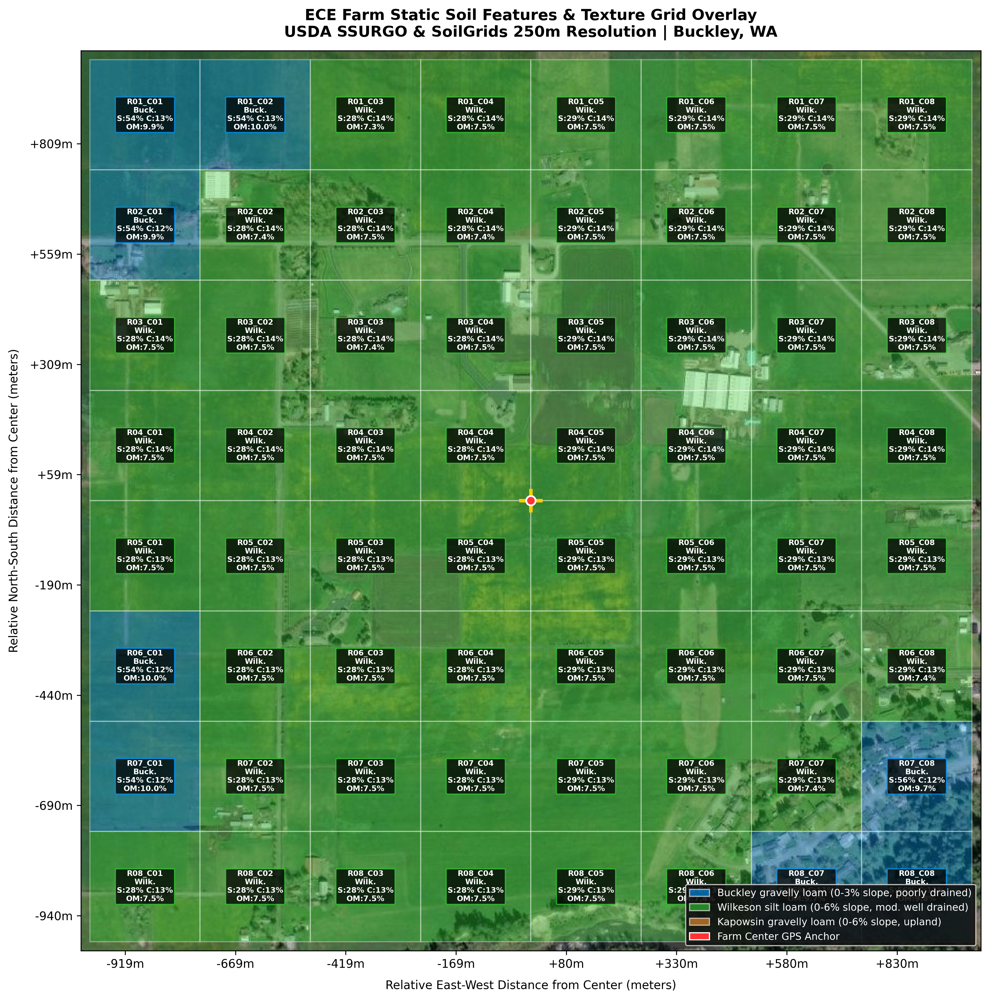

In [4]:
# Query and attach high-resolution elevation before soil classification
df_chunks = fetch_elevation_grid(df_chunks)
df_chunks = extract_soil_features(df_chunks)

fig2_path = FIG_DIR / "farm_basemap_soil_grid.png"
plot_soil_grid_map(df_chunks, img, ext, fig2_path)
print(f"Figure 2 saved to: {fig2_path}")

display(Image(filename=str(fig2_path), width=750))

## 4. Topographical Elevation & Slope Contour Map

Micro-topography dictates surface runoff, hydrological accumulation, and drainage classes. Across this .0	ext{ km} 	imes 2.0	ext{ km}$ territory, elevation spans from $\sim 200	ext{ m}$ to 20+	ext{ m}$ (a 0+	ext{ m}$ gradient), transitioning from higher glaciated terraces in the North/North-East to alluvial drainage flats in the South.

Figure 3 saved to: /scratch/group/p.cis250607.000/MDR-Project/notebooks/experiment/ece_farm_satellite_chunks/figures/farm_terrain_elevation_slope.png


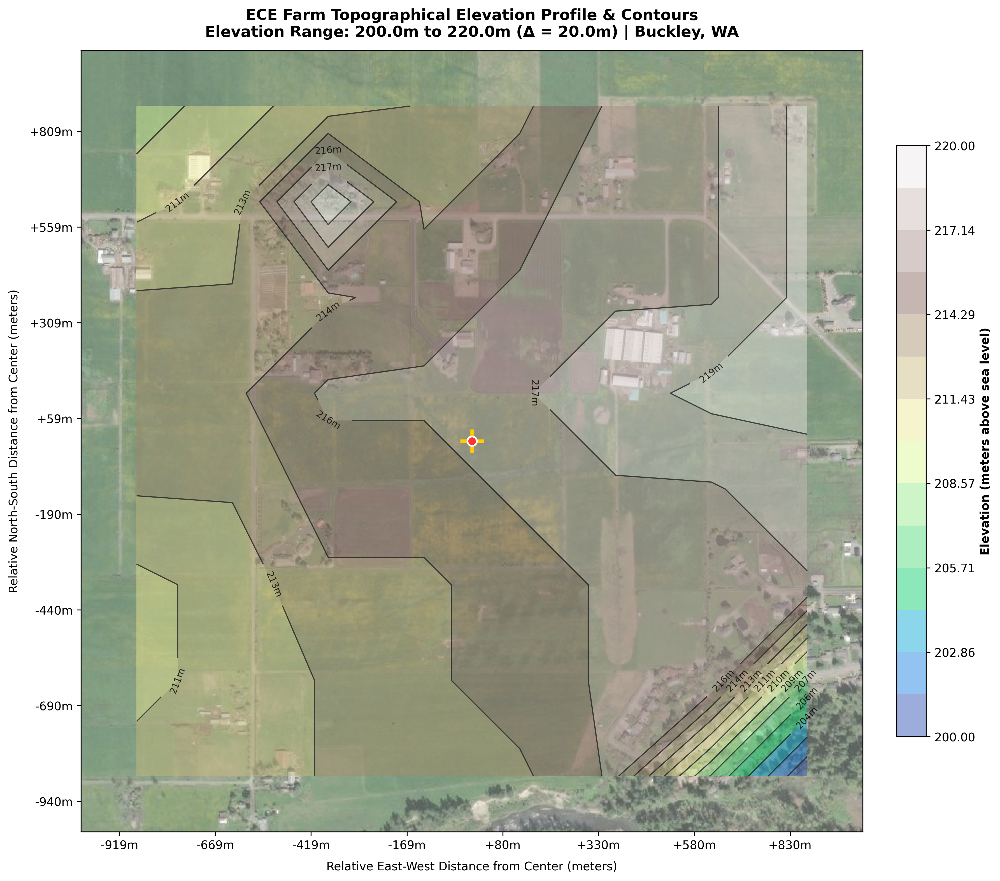

In [5]:
fig3_path = FIG_DIR / "farm_terrain_elevation_slope.png"
plot_terrain_contour_map(df_chunks, img, ext, fig3_path)
print(f"Figure 3 saved to: {fig3_path}")

display(Image(filename=str(fig3_path), width=750))

## 5. Statistical Feature Validation & Inter-Chunk Separability

To validate that sensor nodes deployed across different chunks receive distinct inputs (avoiding identical model predictions), we compute:
1. **Multi-Channel Optical Indices**: Mean Red/Green/Blue reflectance, Green-Red Vegetation Index (GRVI), and Visible Atmospherically Resistant Index (VARI).
2. **Inter-Chunk Feature Variance ( > 0$)**: Verifying that $\sigma > 0$ across all terrain, soil, and optical channels.
3. **Pairwise Dissimilarity Matrix**: Demonstrating multivariate separation between non-adjacent chunks.

Figure 4 saved to: /scratch/group/p.cis250607.000/MDR-Project/notebooks/experiment/ece_farm_satellite_chunks/figures/farm_feature_heterogeneity_heatmap.png


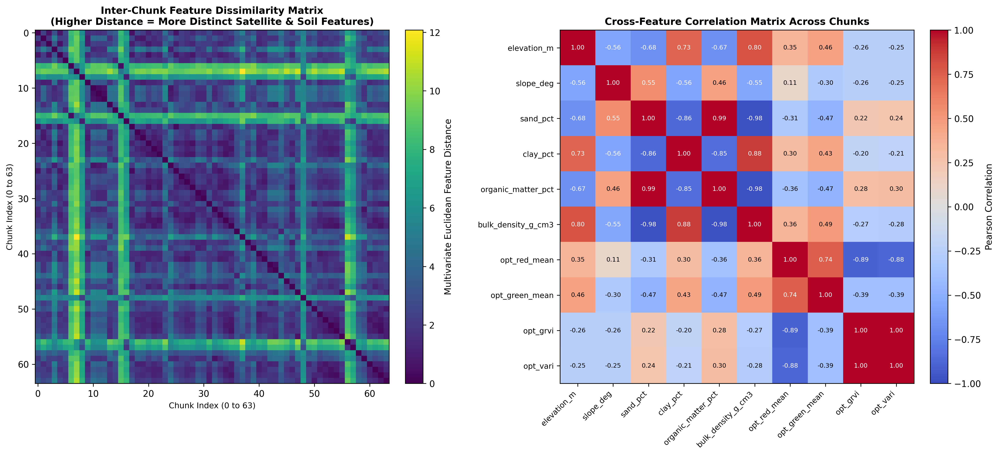

Saved chunk database to: /scratch/group/p.cis250607.000/MDR-Project/notebooks/experiment/ece_farm_satellite_chunks/farm_grid_chunks.csv
Saved summary statistics to: /scratch/group/p.cis250607.000/MDR-Project/notebooks/experiment/ece_farm_satellite_chunks/feature_variance_summary.csv


,Feature,Mean,Std,Min,Max,CV (%),Distinct_Values_Confirmed
0,elevation_m,214.44,3.31,200.00,220.00,1.54,True
1,slope_deg,0.49,0.59,0.11,3.01,120.42,True
2,sand_pct,31.82,8.74,27.60,56.50,27.45,True
3,clay_pct,13.31,0.62,11.30,13.90,4.67,True
4,silt_pct,54.87,8.21,32.00,59.30,14.96,True
5,organic_matter_pct,7.78,0.79,7.30,10.00,10.18,True
6,bulk_density_g_cm3,1.18,0.04,1.05,1.21,3.48,True
7,sand_clay_ratio,2.43,0.84,2.01,5.00,34.57,True
8,opt_red_mean,82.53,12.55,49.60,116.00,15.21,True
9,opt_green_mean,106.71,7.47,81.30,128.90,7.00,True


In [6]:
# 1. Extract optical reflectance & indices from satellite image
df_chunks = extract_optical_features_from_image(df_chunks, img, ext)

# 2. Generate Figure 4 (Heatmap & Correlation Matrix)
fig4_path = FIG_DIR / "farm_feature_heterogeneity_heatmap.png"
plot_feature_heterogeneity_heatmap(df_chunks, fig4_path)
print(f"Figure 4 saved to: {fig4_path}")
display(Image(filename=str(fig4_path), width=900))

# 3. Compute summary statistics
numeric_cols = [
    "elevation_m", "slope_deg", "sand_pct", "clay_pct", "silt_pct",
    "organic_matter_pct", "bulk_density_g_cm3", "sand_clay_ratio",
    "opt_red_mean", "opt_green_mean", "opt_blue_mean", "opt_grvi", "opt_vari"
]

stats_list = []
for col in numeric_cols:
    vals = df_chunks[col].values
    mean_val = float(np.mean(vals))
    std_val = float(np.std(vals))
    min_val = float(np.min(vals))
    max_val = float(np.max(vals))
    cv_val = float(std_val / (abs(mean_val) + 1e-6) * 100.0)
    stats_list.append({
        "Feature": col,
        "Mean": round(mean_val, 2),
        "Std": round(std_val, 2),
        "Min": round(min_val, 2),
        "Max": round(max_val, 2),
        "CV (%)": round(cv_val, 2),
        "Distinct_Values_Confirmed": bool(std_val > 0.0),
    })

df_stats = pd.DataFrame(stats_list)

# 4. Save CSV exports
csv_path = EXP_DIR / "farm_grid_chunks.csv"
df_chunks.to_csv(csv_path, index=False)

stats_csv_path = EXP_DIR / "feature_variance_summary.csv"
df_stats.to_csv(stats_csv_path, index=False)

print(f"Saved chunk database to: {csv_path}")
print(f"Saved summary statistics to: {stats_csv_path}")
df_stats


## 6. Field Deployment Reference Table

The table below provides reference GPS coordinates, elevations, and soil properties across the farm grid chunks. The ECE field team can cross-reference their accessible farm plots with these chunk coordinates to select sensor locations that span different soil series and satellite chunks.

In [7]:
# Display representative chunks spanning across different sectors of the farm
display_cols = [
    'chunk_id', 'row', 'col', 'center_lat', 'center_lon',
    'elevation_m', 'slope_deg', 'soil_series', 'sand_pct', 'clay_pct', 'organic_matter_pct', 'opt_grvi'
]
df_rep = df_chunks[display_cols].iloc[::4].reset_index(drop=True)
print(f"Representative Sampling Across 16 Grid Sectors (Total {len(df_chunks)} chunks):")
df_rep

Representative Sampling Across 16 Grid Sectors (Total 64 chunks):


,chunk_id,row,col,center_lat,center_lon,elevation_m,slope_deg,soil_series,sand_pct,clay_pct,organic_matter_pct,opt_grvi
0,R08_C01,8,1,47.175796,-122.040221,212.0,0.229182,Wilkeson,27.6,13.1,7.5,0.1780
1,R08_C05,8,5,47.175796,-122.031238,214.0,0.324110,Wilkeson,28.6,13.1,7.5,0.1671
2,R07_C01,7,1,47.177323,-122.040221,211.0,0.256233,Buckley,53.9,11.5,10.0,0.2147
3,R07_C05,7,5,47.177323,-122.031238,215.0,0.256233,Wilkeson,28.6,13.2,7.5,0.2300
4,R06_C01,6,1,47.178849,-122.040221,211.0,0.324110,Buckley,53.9,11.7,10.0,0.2333
5,R06_C05,6,5,47.178849,-122.031238,215.0,0.256233,Wilkeson,28.6,13.3,7.5,0.1562
6,R05_C01,5,1,47.180376,-122.040221,213.0,0.229182,Wilkeson,27.6,13.4,7.5,0.2312
7,R05_C05,5,5,47.180376,-122.031238,216.0,0.324110,Wilkeson,28.6,13.4,7.5,0.1625
8,R04_C01,4,1,47.181902,-122.040221,213.0,0.229182,Wilkeson,27.6,13.6,7.5,0.1904
9,R04_C05,4,5,47.181902,-122.031238,217.0,0.229182,Wilkeson,28.6,13.6,7.5,0.0806
